In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import math

In [10]:
# Set up paths
SCRIPT_DIR_PATH = os.getcwd()
PROJECT_DIR_PATH = os.path.dirname(SCRIPT_DIR_PATH)
MODEL_DIR_PATH = os.path.join(PROJECT_DIR_PATH, 'model')
OUTPUTS_DIR_PATH = os.path.join(MODEL_DIR_PATH, 'outputs')
BASELINE_DIR_PATH = os.path.join(OUTPUTS_DIR_PATH, 'baseline')
ENSEMBLE_DIR_PATH = os.path.join(OUTPUTS_DIR_PATH, 'ensemble')
EXP_DESIGN_DIR_PATH = os.path.join(OUTPUTS_DIR_PATH, 'exp_design')

In [11]:
def simple_line_plot(df, x, y, title, xlabel, ylabel):
    fig, ax = plt.subplots()
    df.plot(x=x, y=y, ax=ax)
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    plt.grid(True)
    plt.show()
    plt.close()
   
    return None

## Baseline Plots

In [12]:
baseline_df = pd.read_csv(os.path.join(BASELINE_DIR_PATH, 'baseline_config_1_output.csv'))
baseline_df.head()

,time,State_Inputs,State_Capacity,Administrative_Complexity,Systemic_Burden,State_Integrity
0,0.00,1.000000,0.500000,0.100000,0.050000,0.500000
1,0.01,0.999795,0.500500,0.100150,0.050017,0.500225
2,0.02,0.999590,0.501000,0.100299,0.050034,0.500450
3,0.03,0.999385,0.501499,0.100449,0.050052,0.500676
4,0.04,0.999181,0.501999,0.100599,0.050069,0.500901


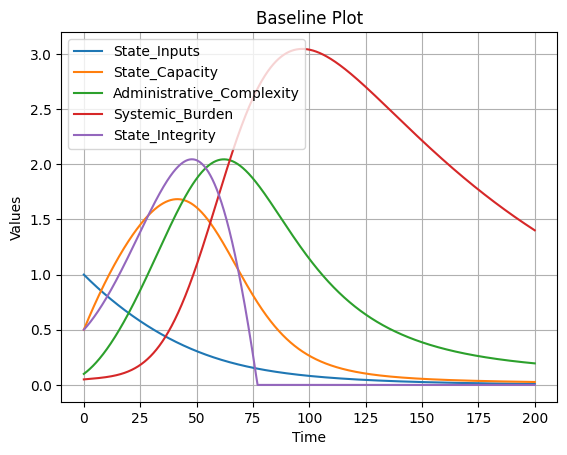

In [5]:
state_variables = ["State_Inputs", "State_Capacity", "Administrative_Complexity", "Systemic_Burden", "State_Integrity"]

# Plot the data
simple_line_plot(baseline_df, 'time', state_variables, 'Baseline Plot', 'Time', 'Values')

## Ensemble

In [13]:
output_df = pd.read_csv(os.path.join(ENSEMBLE_DIR_PATH, 'ensemble_config_1_output.csv'))
output_df.head()

,State_Inputs,State_Capacity,Administrative_Complexity,Systemic_Burden,State_Integrity,time,run_id
0,1.000000,0.500000,0.100000,0.050000,0.500000,0.0,1.0
1,0.998573,0.505737,0.102004,0.050059,0.505632,0.2,1.0
2,0.997146,0.511467,0.104032,0.050119,0.511318,0.4,1.0
3,0.995720,0.517188,0.106081,0.050182,0.517058,0.6,1.0
4,0.994294,0.522903,0.108154,0.050247,0.522853,0.8,1.0


In [14]:
output_df

,State_Inputs,State_Capacity,Administrative_Complexity,Systemic_Burden,State_Integrity,time,run_id
0,1.000000,0.500000,0.100000,0.050000,0.500000,0.0,1.0
1,0.998573,0.505737,0.102004,0.050059,0.505632,0.2,1.0
2,0.997146,0.511467,0.104032,0.050119,0.511318,0.4,1.0
3,0.995720,0.517188,0.106081,0.050182,0.517058,0.6,1.0
4,0.994294,0.522903,0.108154,0.050247,0.522853,0.8,1.0
...,...,...,...,...,...,...,...
100095,0.067972,0.098367,0.255493,1.541807,-0.000191,199.2,100.0
100096,0.067810,0.098260,0.255074,1.539508,-0.000191,199.4,100.0
100097,0.067649,0.098153,0.254657,1.537212,-0.000191,199.6,100.0
100098,0.067487,0.098046,0.254242,1.534919,-0.000191,199.8,100.0


In [16]:
# Load experiment data
exp_design_df = pd.read_csv(os.path.join(EXP_DESIGN_DIR_PATH, 'exp_design_ensemble_config_1_output.csv'))
exp_design_df.head()

,k_input_replenishment,ef_inputs_capacity,ef_complexity_support,alpha_complexity_saturation,k_cost_complexity,k_capacity_drain,k_complexity_growth,k_complexity_decay,k_burden_accumulation,k_burden_reduction,k_burden_from_complexity,k_integrity_gain,k_integrity_loss_burden,k_integrity_loss_inputs,run_id
0,0.729034,0.572748,1.321673,0.961246,1.414154,0.610654,0.667367,0.854866,0.597729,1.403315,1.482041,1.247121,1.258729,1.161854,1
1,0.980985,0.535829,0.736498,0.937978,1.071097,0.722719,1.468542,1.427632,0.841201,0.950979,1.251124,1.263654,0.504236,0.695745,2
2,1.308815,0.605192,0.531653,0.826684,1.220304,1.143981,0.948040,0.873542,0.583196,0.553706,0.696828,1.438715,1.340652,0.656519,3
3,0.902834,0.522873,1.401947,0.603423,1.309691,0.605553,0.758652,0.715292,1.012564,1.377411,0.761983,1.145844,1.109353,0.618613,4
4,0.581159,1.271748,1.295906,1.376975,0.563007,1.299752,1.057860,1.211464,0.720520,1.194024,1.022130,0.649914,1.260935,0.757545,5


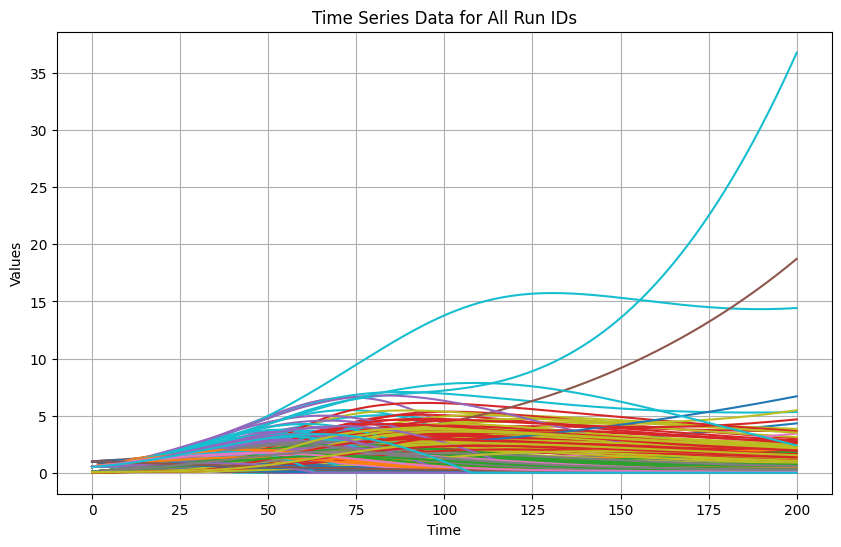

In [17]:
# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Define the columns to plot
columns_to_plot = ["State_Inputs", "State_Capacity", "Administrative_Complexity", "Systemic_Burden", "State_Integrity"]

# Loop through each unique 'run_id'
for run_id in output_df['run_id'].unique():
    subset = output_df[output_df['run_id'] == run_id]
    for column in columns_to_plot:
        ax.plot(subset['time'], subset[column], label=f'{column} Run ID {run_id}')

# Adding plot title and labels
ax.set_title('Time Series Data for All Run IDs')
ax.set_xlabel('Time')
ax.set_ylabel('Values')
ax.grid(True)

# Show the plot
plt.show()

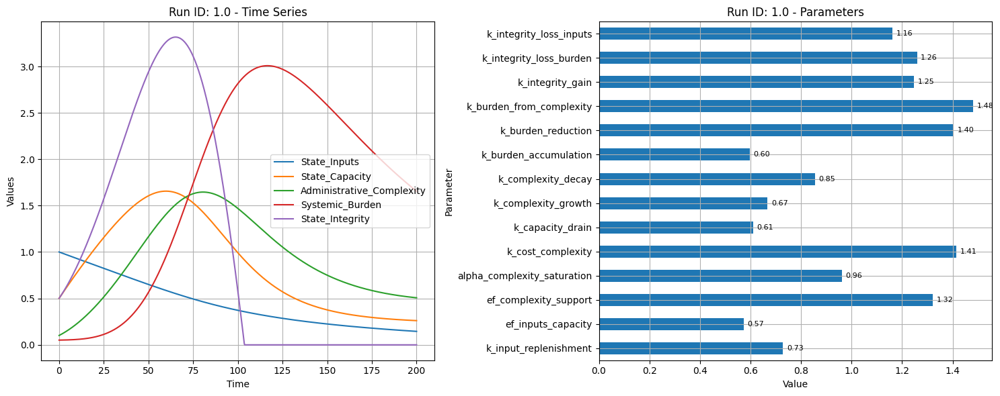

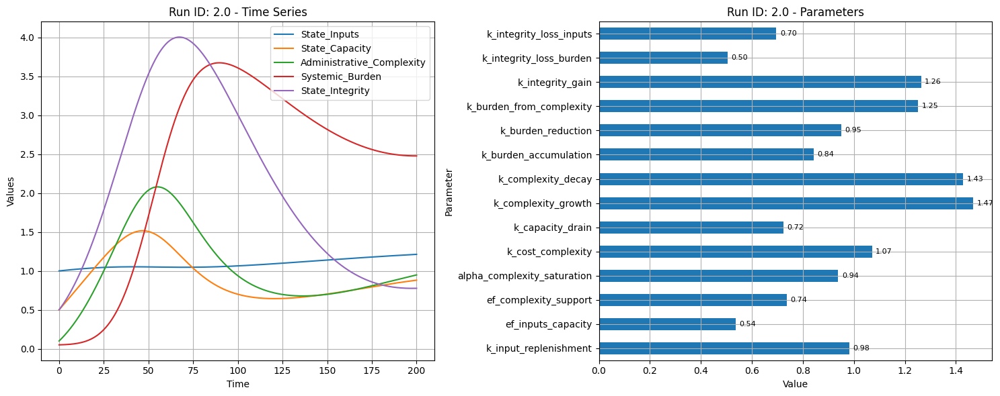

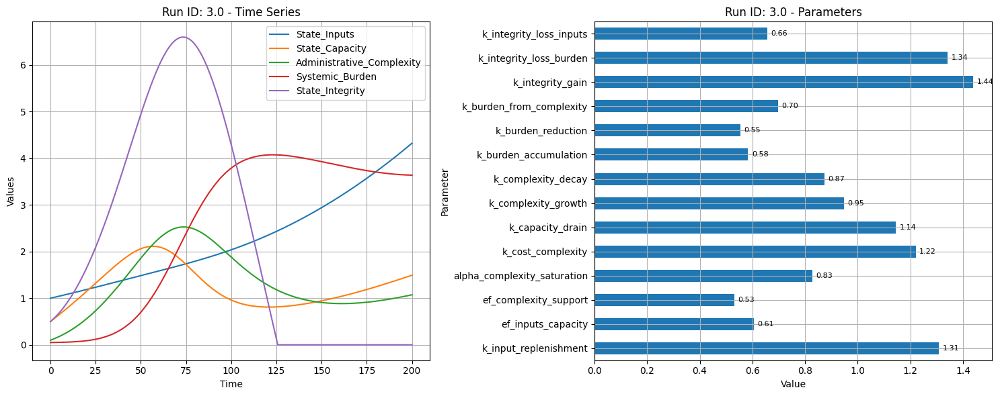

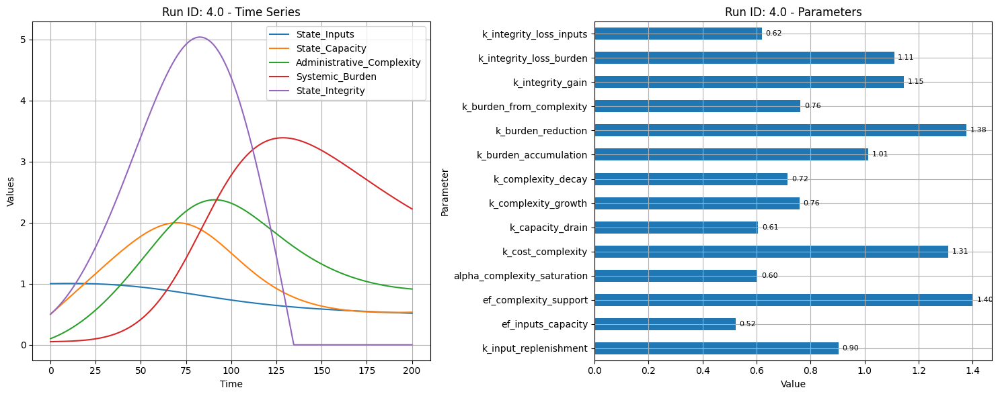

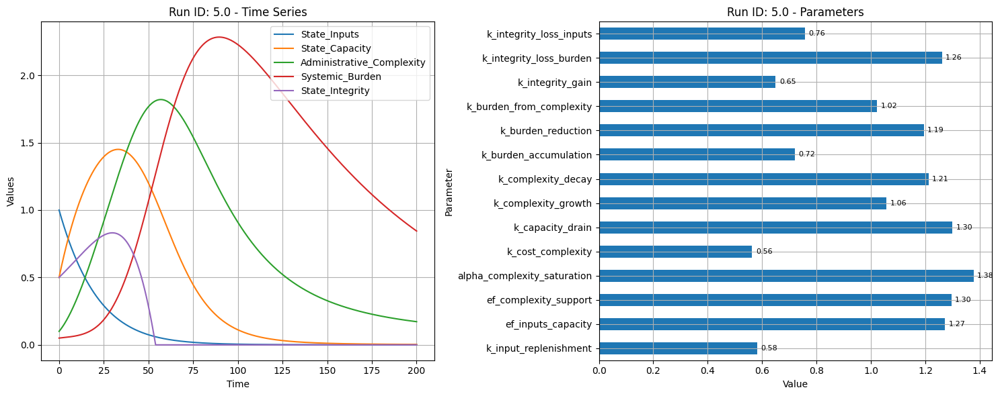

...

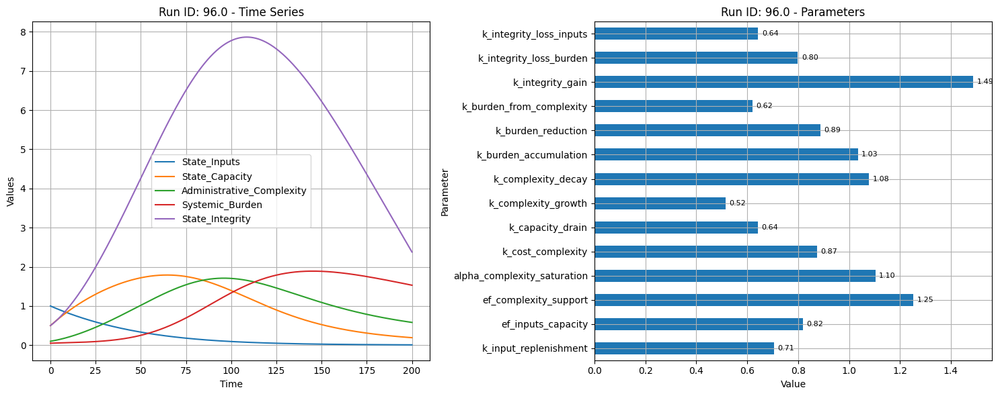

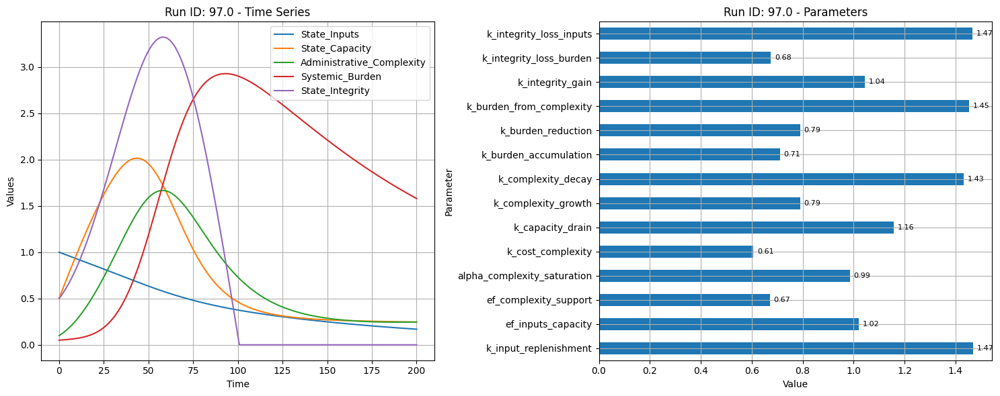

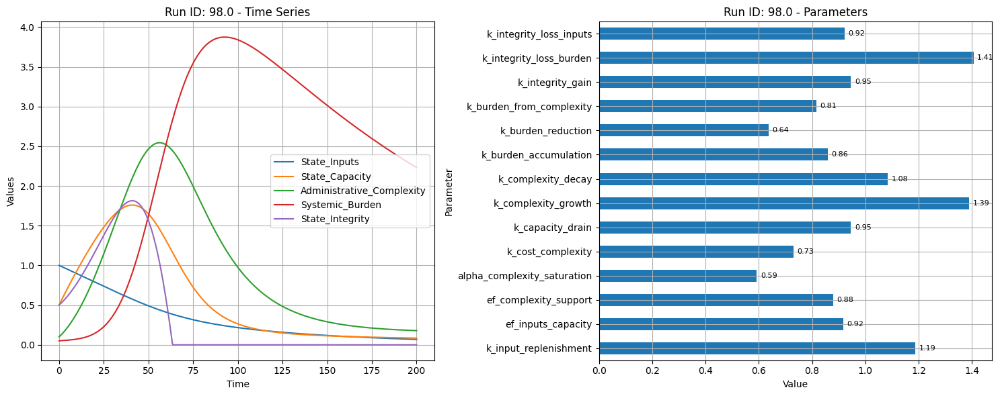

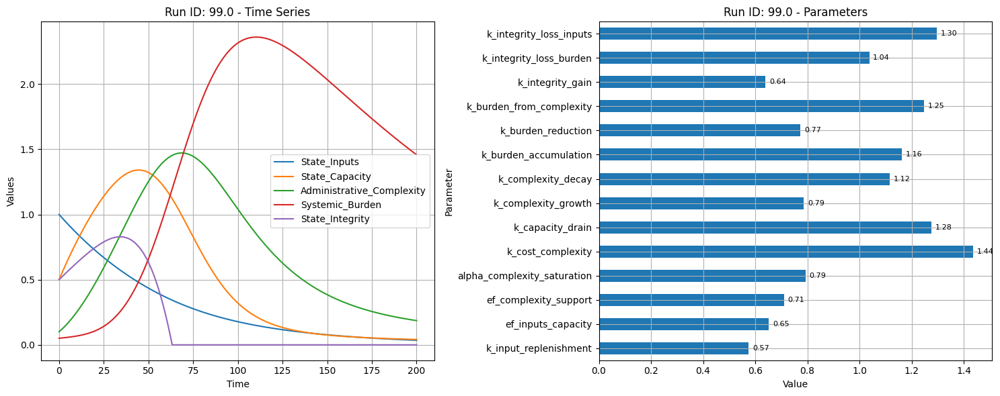

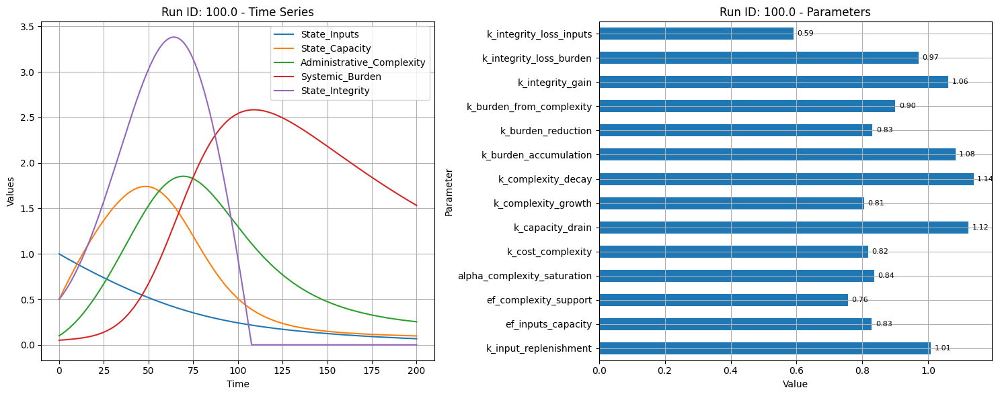

In [18]:
# Define the columns you want to plot.
parameters_to_plot = [
    "k_input_replenishment",
    "ef_inputs_capacity",
    "ef_complexity_support",
    "alpha_complexity_saturation",
    "k_cost_complexity",
    "k_capacity_drain",
    "k_complexity_growth",
    "k_complexity_decay",
    "k_burden_accumulation",
    "k_burden_reduction",
    "k_burden_from_complexity",
    "k_integrity_gain",
    "k_integrity_loss_burden",
    "k_integrity_loss_inputs"
]


stocks_to_plot = ["State_Inputs", "State_Capacity", "Administrative_Complexity", "Systemic_Burden", "State_Integrity"]

# Loop over each run_id and create one figure with two subplots.
for run_id in output_df['run_id'].unique():
    subset_output = output_df[output_df['run_id'] == run_id]
    subset_exp_design = exp_design_df[exp_design_df['run_id'] == run_id]
    
    # Create a figure with 1 row and 2 columns of subplots.
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # Time series plot on the left subplot.
    subset_output.plot(x='time', y=stocks_to_plot, ax=ax1, title=f'Run ID: {run_id} - Time Series')
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Values')
    ax1.legend()
    ax1.grid(True)
    
    # Horizontal bar plot on the right subplot.
    # Use the first row of exp_design data for this run_id.
    data_bar = subset_exp_design[parameters_to_plot].iloc[0]
    data_bar.plot(kind='barh', ax=ax2, title=f'Run ID: {run_id} - Parameters')
    ax2.set_xlabel('Value')
    ax2.set_ylabel('Parameter')
    ax2.grid(True)
    
    # Add labels to each bar with the actual value.
    # Compute an offset relative to the maximum value so the text doesn't overlap the bar.
    offset = data_bar.max() * 0.01  
    for patch in ax2.patches:
        ax2.text(patch.get_width() + offset, 
                 patch.get_y() + patch.get_height() / 2,
                 f'{patch.get_width():.2f}', 
                 ha='left', va='center', fontsize=8)
    
    plt.tight_layout()
    plt.show()


In [22]:
# for run_id in output_df['run_id'].unique():
#     subset = output_df[output_df['run_id'] == run_id]
#     subset.plot(x='time', y=columns_to_plot, figsize=(10, 6), title=f'Run ID: {run_id}')
#     plt.xlabel('Time')
#     plt.ylabel('Values')
#     plt.legend()
#     plt.grid(True)
#     plt.show()


In [23]:
# for run_id in output_df['run_id'].unique():
#     subset = output_df[(output_df['run_id'] == run_id) & (output_df['time'] < 10)]
#     subset.plot(x='time', y=columns_to_plot, figsize=(10, 6), title=f'Run ID: {run_id}')
#     plt.xlabel('Time')
#     plt.ylabel('Values')
#     plt.legend()
#     plt.grid(True)
#     plt.show()
